#### TASK: Forecasting bus demand in Banana Republic municipalities.

* The central urban planning commitee of Banana Republic asked you to help them with the forecast of bus demands of municipalities. And they provide a nice dataset to support you.

* The dataset includes two measurements for an hour for the number of used buses in each municipality, each measurement is timestamped. The dataset format is as follows (comma separated values): `MUNICIPALITY_ID, TIMESTAMP, USAGE, TOTAL_CAPACITY` where municipality_id is an anonymization to disguise the actual names, timestamp represents the exact time of the measurement, usage is the number of buses in use at the time of measurement and total_capacity represents the total number of buses in the municipality. There are 10 municipalities (ids from 0 to 9), and two measurements for an hour.

* The committee asks you to forecast the hourly bus usages for next week for each municipality. Hence you can aggregate the two measurements for an hour by taking the max value (sum would not be a nice idea for the obvious reasons) for each hour, and you should model this data with a time series model of your selection. (It would be a nice idea to implement a very simple baseline model first, and then try to improve the accuracy by introducing more complex methods eventually. The bare minimum requirement of the task is one simple baseline and one complex method.)

* The committee says that they will use the last two weeks (starting from 2017-08-05 to 2017-08-19) as assessment (test) data, hence your code should report the error (in the criterion you chose for the task) for the last two weeks. You may use true values for the prediction of the last week of test data, then combine the error of the first and last week of the test separately.

* Keep in mind that the dataset has missing data, hence a suitable missing data interpolation would be useful.

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import pandas_profiling
pd.set_option('display.max_columns', 1000)

import warnings
warnings.filterwarnings('ignore')

C:\Users\ugrceyln\AppData\Local\Temp\ipykernel_2484\3300106132.py:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [2]:
df = pd.read_csv("municipality_bus_utilization.csv")
df.head()

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


In [3]:
df.sort_values(by=["municipality_id", "timestamp"])

,timestamp,municipality_id,usage,total_capacity
3,2017-06-04 07:59:42,0,204,2813
18,2017-06-04 08:25:42,0,247,2813
29,2017-06-04 08:59:42,0,332,2813
34,2017-06-04 09:32:46,0,429,2813
47,2017-06-04 09:59:48,0,485,2813
...,...,...,...,...
13021,2017-08-19 14:30:33,9,983,1332
13035,2017-08-19 15:03:34,9,976,1332
13040,2017-08-19 15:29:33,9,954,1332
13054,2017-08-19 16:03:35,9,879,1332


In [4]:
profile = df.profile_report(title='Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['municipality_id'] = df['municipality_id'].astype(str)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13070 entries, 0 to 13069
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   timestamp        13070 non-null  datetime64[ns]
 1   municipality_id  13070 non-null  object        
 2   usage            13070 non-null  int64         
 3   total_capacity   13070 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 408.6+ KB


In [6]:
df['hour'] = df['timestamp'].dt.hour
df['day'] = df['timestamp'].dt.day
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year
df['day_of_week'] = df["timestamp"].dt.day_of_week
df['is_weekend'] = np.where(df['day_of_week'].isin([5,6]), 1,0)

df.head()

,timestamp,municipality_id,usage,total_capacity,hour,day,month,year,day_of_week,is_weekend
0,2017-06-04 07:59:42,9,454,1332,7,4,6,2017,6,1
1,2017-06-04 07:59:42,8,556,2947,7,4,6,2017,6,1
2,2017-06-04 07:59:42,4,1090,3893,7,4,6,2017,6,1
3,2017-06-04 07:59:42,0,204,2813,7,4,6,2017,6,1
4,2017-06-04 07:59:42,7,718,2019,7,4,6,2017,6,1


In [7]:
df_new = df.groupby(['municipality_id', 'total_capacity', 'month', 'day', 'hour', "day_of_week", "is_weekend"], as_index = False)['usage'].max()
df_new

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage
0,0,2813,6,4,7,6,1,204
1,0,2813,6,4,8,6,1,332
2,0,2813,6,4,9,6,1,485
3,0,2813,6,4,10,6,1,583
4,0,2813,6,4,11,6,1,614
...,...,...,...,...,...,...,...,...
6735,9,1332,8,19,12,5,1,849
6736,9,1332,8,19,13,5,1,941
6737,9,1332,8,19,14,5,1,983
6738,9,1332,8,19,15,5,1,976


In [8]:
df_new.groupby("municipality_id").size()

municipality_id
0    674
1    674
2    674
3    674
4    674
5    674
6    674
7    674
8    674
9    674
dtype: int64

In [9]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   municipality_id  6740 non-null   object
 1   total_capacity   6740 non-null   int64 
 2   month            6740 non-null   int64 
 3   day              6740 non-null   int64 
 4   hour             6740 non-null   int64 
 5   day_of_week      6740 non-null   int64 
 6   is_weekend       6740 non-null   int32 
 7   usage            6740 non-null   int64 
dtypes: int32(1), int64(6), object(1)
memory usage: 395.0+ KB


* All municipalities measurement are equals and also there is no missing value as described!!!

In [10]:
df_ts = df_new.loc[df_new['month'] == 8][df_new['day'] >= 5]
df_tr = df_new.drop(df_ts.index.tolist())

df_tr.shape, df_ts.shape

((5320, 8), (1420, 8))

###### Let's visualize train and test data

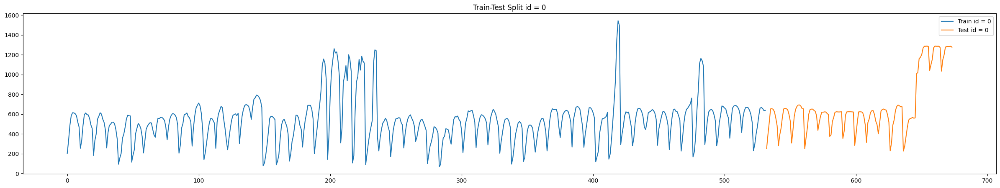

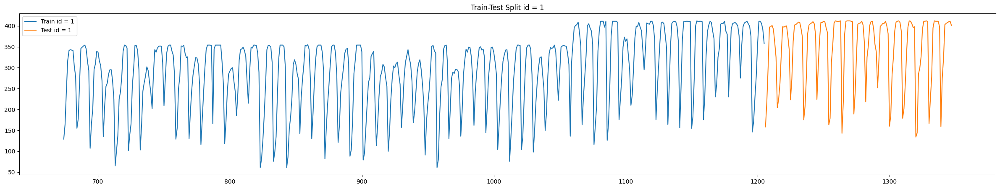

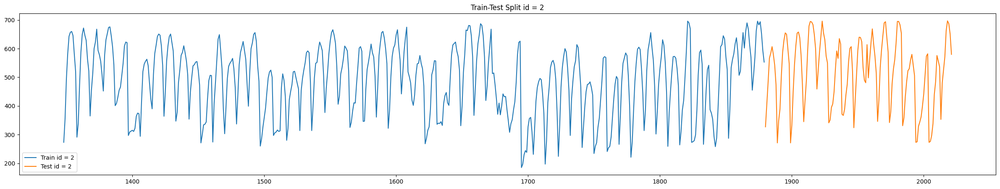

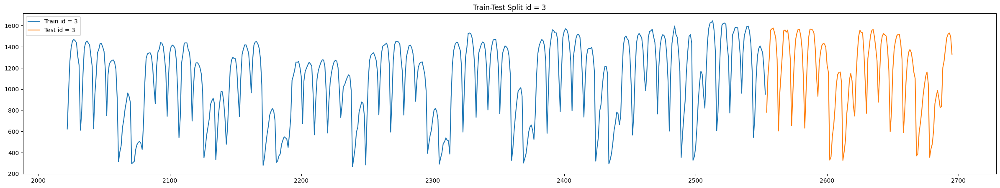

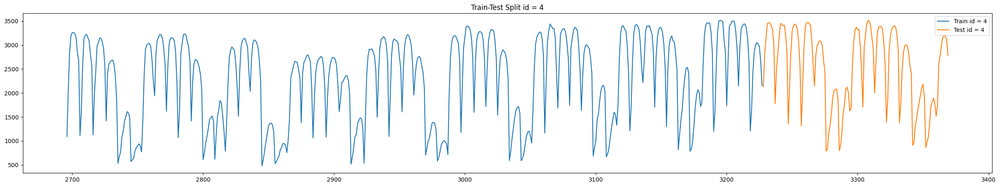

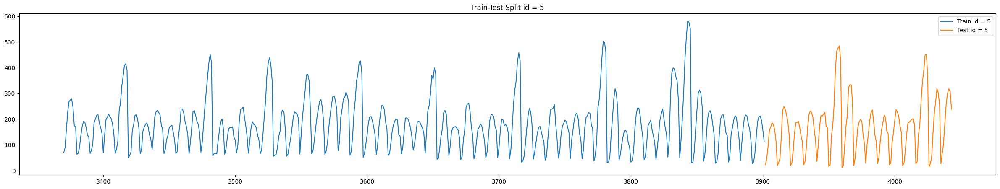

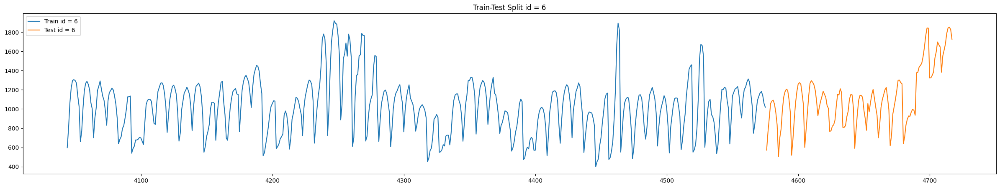

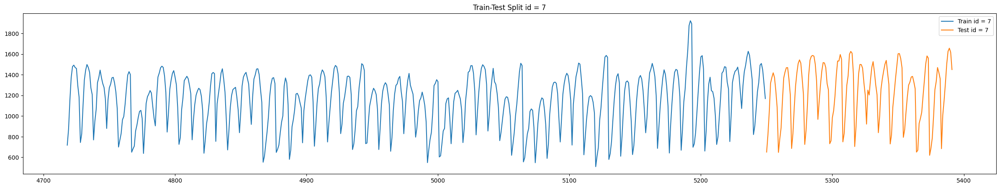

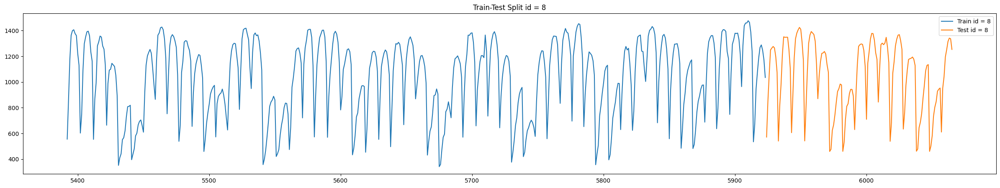

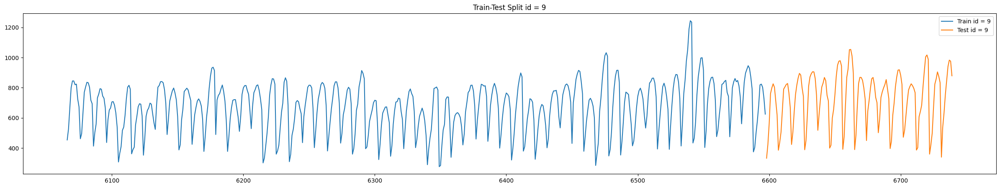

In [11]:
id_list = [str(id) for id in range(10)]

for i in id_list:
    plt.figure(figsize=(30,5))
    plt.plot(df_tr[df_tr['municipality_id'] == i]['usage'].index, df_tr[df_tr['municipality_id'] == i]['usage'], label = 'Train id = {}'.format(i))
    plt.plot(df_ts[df_ts['municipality_id'] == i]['usage'].index, df_ts[df_ts['municipality_id'] == i]['usage'], label = 'Test id = {}'.format(i))
    plt.title('Train-Test Split id = {}'.format(i))
    plt.legend()
    plt.show()


* There are some trends with non-stationary of data, to resque non-stationary of measurement we will continue with their orginal coumn value with  extract useful possible be features attached date. But before it, we will apply a baseline forecasting model

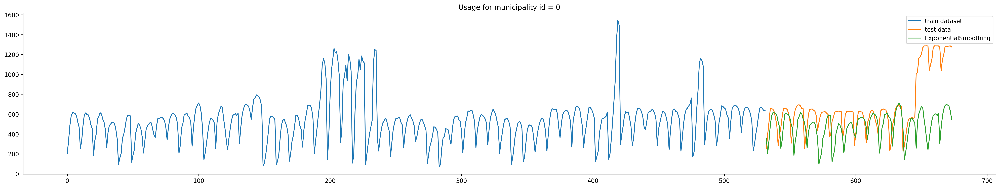

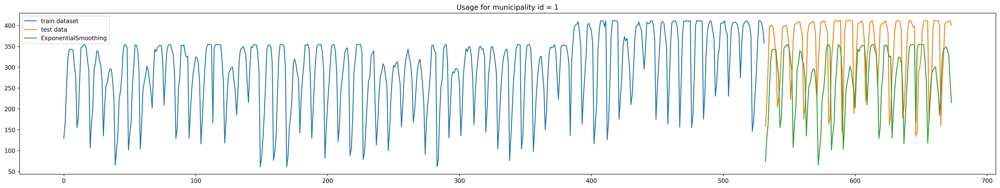

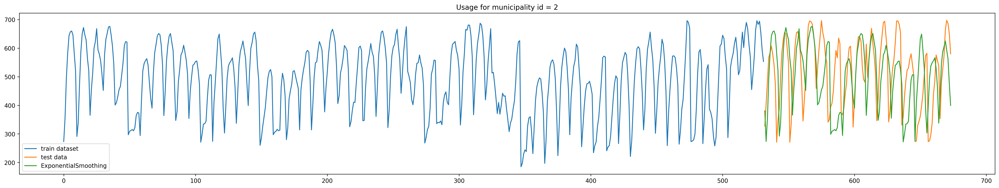

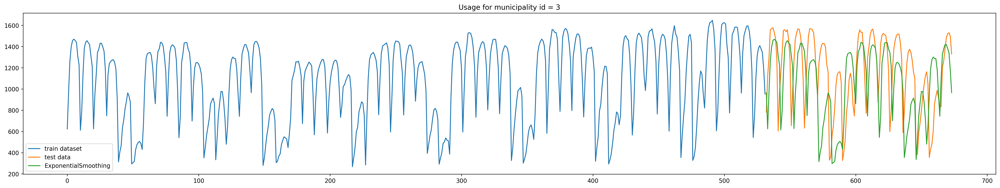

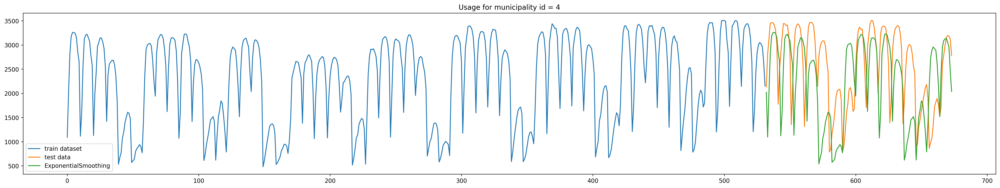

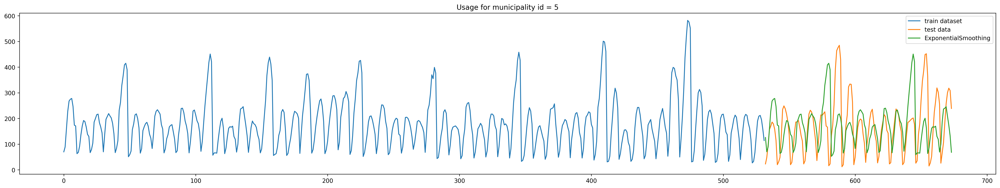

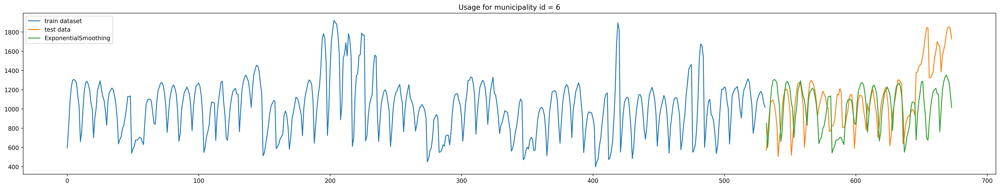

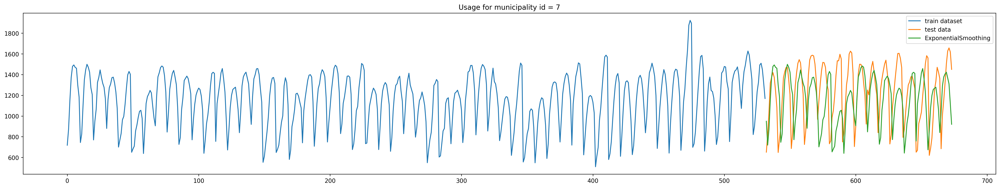

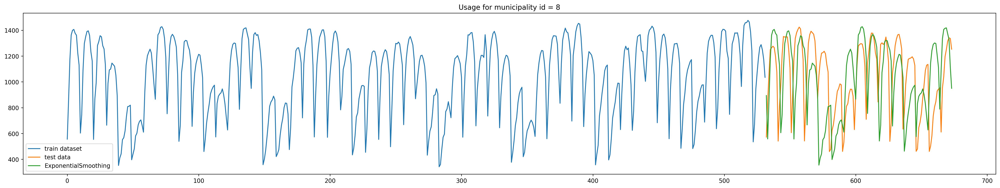

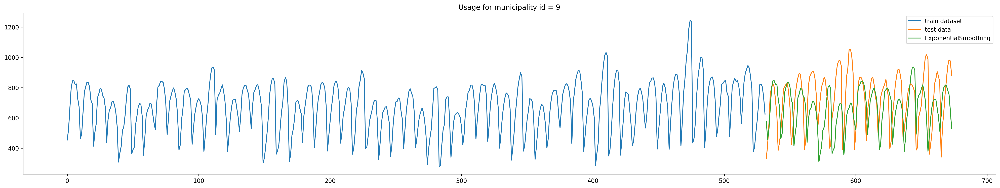

RMSEs for all ids with ExponentialSmoothing model:
{'id0:': 340.98, 'id1:': 120.57, 'id2:': 132.63, 'id3:': 402.22, 'id4:': 976.27, 'id5:': 123.5, 'id6:': 323.85, 'id7:': 320.48, 'id8:': 333.13, 'id9:': 208.31}


In [12]:
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing

d_rmse = {}
for id in id_list:
    tr_exp = pd.Series(df_tr[df_tr['municipality_id'] == id]['usage'].values)
    ts_exp = pd.Series(df_ts[df_ts['municipality_id'] == id]['usage'].values)

    model = ExponentialSmoothing(tr_exp, trend=None, seasonal=None, seasonal_periods=None).fit()
    y_hat = model.predict(start = ts_exp.index[0], end = ts_exp.index[-1])
    
    test_score = np.sqrt(mean_squared_error(ts_exp, y_hat)) 
    d_rmse['id{}:'.format(id)] =  np.round(test_score, 2)

    plt.figure(figsize=(30, 5), dpi=250)
    
    plt.plot(tr_exp, label = 'train dataset')
    plt.plot([None for i in tr_exp] + [x for x in ts_exp], label = "test data")
    plt.plot([None for i in tr_exp] + [x for x in y_hat], label = "ExponentialSmoothing")
    plt.title('Usage for municipality id = {}'.format(id))
    plt.legend()
    plt.show()

print("RMSEs for all ids with ExponentialSmoothing model:")
print(d_rmse)

* Before give any complex model, we make feature engineering

##### FEATURE ENGİNEERING

* Instead of directly using total_capaciy, It will used as getting of total usage percent via obtaining as divide usage and total_capacity as followwing. Because it can be useful. But before it, lets concat train and test data to extract features on both of them

In [13]:
df_tr["is_test"] = 0
df_ts["is_test"] = 1

df = pd.concat([df_tr, df_ts])
df.shape

(6740, 9)

In [14]:
df["total_usage_percent"] = df["usage"] / df["total_capacity"]
df

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent
0,0,2813,6,4,7,6,1,204,0,0.072520
1,0,2813,6,4,8,6,1,332,0,0.118023
2,0,2813,6,4,9,6,1,485,0,0.172414
3,0,2813,6,4,10,6,1,583,0,0.207252
4,0,2813,6,4,11,6,1,614,0,0.218272
...,...,...,...,...,...,...,...,...,...,...
6735,9,1332,8,19,12,5,1,849,1,0.637387
6736,9,1332,8,19,13,5,1,941,1,0.706456
6737,9,1332,8,19,14,5,1,983,1,0.737988
6738,9,1332,8,19,15,5,1,976,1,0.732733


* Get period of day with hour 

In [15]:
df.loc[df.hour < 7, 'period'] = 'em'
df.loc[(df.hour >= 7) & (df.hour < 11), 'period'] = 'am'
df.loc[(df.hour >= 11) & (df.hour < 15), 'period'] = 'mid'
df.loc[(df.hour >= 15) & (df.hour < 19), 'period'] = 'eve'
df.loc[(df.hour >= 19) & (df.hour <= 24), 'period'] = 'pm'

df

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent,period
0,0,2813,6,4,7,6,1,204,0,0.072520,am
1,0,2813,6,4,8,6,1,332,0,0.118023,am
2,0,2813,6,4,9,6,1,485,0,0.172414,am
3,0,2813,6,4,10,6,1,583,0,0.207252,am
4,0,2813,6,4,11,6,1,614,0,0.218272,mid
...,...,...,...,...,...,...,...,...,...,...,...
6735,9,1332,8,19,12,5,1,849,1,0.637387,mid
6736,9,1332,8,19,13,5,1,941,1,0.706456,mid
6737,9,1332,8,19,14,5,1,983,1,0.737988,mid
6738,9,1332,8,19,15,5,1,976,1,0.732733,eve


In [16]:
df["year"] = 2017
df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
df.head()

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent,period,year,datetime
0,0,2813,6,4,7,6,1,204,0,0.072520,am,2017,2017-06-04 07:00:00
1,0,2813,6,4,8,6,1,332,0,0.118023,am,2017,2017-06-04 08:00:00
2,0,2813,6,4,9,6,1,485,0,0.172414,am,2017,2017-06-04 09:00:00
3,0,2813,6,4,10,6,1,583,0,0.207252,am,2017,2017-06-04 10:00:00
4,0,2813,6,4,11,6,1,614,0,0.218272,mid,2017,2017-06-04 11:00:00


In [17]:
# Let us find the difference between next and previous buses
def find_difference_bw_bus(data):
  
    data.sort_values(["municipality_id", "datetime"],inplace=True,ascending=True)
    # data["diff_btw_0_1_next_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(-1)).dt.total_seconds()/3600
    data["diff_btw_0_1_previous_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(1)).dt.total_seconds()/3600
    # data["diff_btw_0_2_next_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(-2)).dt.total_seconds()/3600
    data["diff_btw_0_2_previous_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(2)).dt.total_seconds()/3600
    # data["diff_btw_0_3_next_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(-3)).dt.total_seconds()/3600
    data["diff_btw_0_3_previous_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(3)).dt.total_seconds()/3600
    # data["diff_btw_next_previous_bus"]=(data.groupby(["municipality_id"]).datetime.shift(-1)-data.groupby(["municipality_id"]).datetime.shift(1)).dt.total_seconds()/3600
    data["diff_btw_0_4_previous_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(4)).dt.total_seconds()/3600
    data["diff_btw_0_5_previous_bus"]=(data["datetime"]-data.groupby(["municipality_id"]).datetime.shift(5)).dt.total_seconds()/3600

    fea=[# 'diff_btw_0_1_next_bus', 
         'diff_btw_0_1_previous_bus', 
         # 'diff_btw_0_2_next_bus', 
         'diff_btw_0_2_previous_bus',
         # 'diff_btw_0_3_next_bus', 
         'diff_btw_0_3_previous_bus',
         # 'diff_btw_next_previous_bus',
         'diff_btw_0_4_previous_bus',
         'diff_btw_0_5_previous_bus',

        ]
    
    data[fea]=data.groupby(["municipality_id"])[fea].fillna(method="ffill")
    data[fea]=data.groupby(["municipality_id"])[fea].fillna(method="backfill")

    return data

In [18]:
data = find_difference_bw_bus(df)
data.head()

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent,period,year,datetime,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus
0,0,2813,6,4,7,6,1,204,0,0.072520,am,2017,2017-06-04 07:00:00,1.0,2.0,3.0,4.0,5.0
1,0,2813,6,4,8,6,1,332,0,0.118023,am,2017,2017-06-04 08:00:00,1.0,2.0,3.0,4.0,5.0
2,0,2813,6,4,9,6,1,485,0,0.172414,am,2017,2017-06-04 09:00:00,1.0,2.0,3.0,4.0,5.0
3,0,2813,6,4,10,6,1,583,0,0.207252,am,2017,2017-06-04 10:00:00,1.0,2.0,3.0,4.0,5.0
4,0,2813,6,4,11,6,1,614,0,0.218272,mid,2017,2017-06-04 11:00:00,1.0,2.0,3.0,4.0,5.0


In [19]:
df = data.copy()

In [20]:
# Set 'datetime' column as the index
df.set_index('datetime', inplace=True)

# Sort DataFrame by the index in ascending order
df.sort_index(ascending=True, inplace=True)

In [21]:
# Sort DataFrame by the 'datetime' column in ascending order
df.sort_values('datetime', inplace=True)

# Group the data by 'municipality_id'
grouped = df.groupby('municipality_id')

# Calculate the rolling sum of 'usage' for each group with a window of 7 days (last week)
df['last_week_usage'] = grouped['usage'].transform(lambda x: x.rolling('7D').sum().shift())
df['last_2_week_usage'] = grouped['usage'].transform(lambda x: x.rolling('14D').sum().shift())
df['last_3_week_usage'] = grouped['usage'].transform(lambda x: x.rolling('21D').sum().shift())
df['last_month_usage'] = grouped['usage'].transform(lambda x: x.rolling('30D').sum().shift())

# Reset the DataFrame's index if needed
df.reset_index(drop=True, inplace=True)

df

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent,period,year,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,last_week_usage,last_2_week_usage,last_3_week_usage,last_month_usage
0,0,2813,6,4,7,6,1,204,0,0.072520,am,2017,1.0,2.0,3.0,4.0,5.0,NaN,NaN,NaN,NaN
1,3,1930,6,4,7,6,1,623,0,0.322798,am,2017,1.0,2.0,3.0,4.0,5.0,NaN,NaN,NaN,NaN
2,4,3893,6,4,7,6,1,1090,0,0.279990,am,2017,1.0,2.0,3.0,4.0,5.0,NaN,NaN,NaN,NaN
3,1,397,6,4,7,6,1,129,0,0.324937,am,2017,1.0,2.0,3.0,4.0,5.0,NaN,NaN,NaN,NaN
4,5,587,6,4,7,6,1,70,0,0.119250,am,2017,1.0,2.0,3.0,4.0,5.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6735,3,1930,8,19,16,5,1,1330,1,0.689119,eve,2017,1.0,2.0,3.0,4.0,5.0,74496.0,152426.0,201127.0,303107.0
6736,2,697,8,19,16,5,1,580,1,0.832138,eve,2017,1.0,2.0,3.0,4.0,5.0,33769.0,69285.0,90256.0,129605.0
6737,1,397,8,19,16,5,1,401,1,1.010076,eve,2017,1.0,2.0,3.0,4.0,5.0,22828.0,46366.0,59291.0,88131.0
6738,0,2813,8,19,16,5,1,1276,1,0.453608,eve,2017,1.0,2.0,3.0,4.0,5.0,53662.0,91258.0,112225.0,160449.0


In [22]:
fill_cols = ['last_week_usage', 'last_2_week_usage', 'last_3_week_usage', 'last_month_usage']

In [23]:
df[fill_cols]=df.groupby(["municipality_id"])[fill_cols].fillna(method="ffill")
df[fill_cols]=df.groupby(["municipality_id"])[fill_cols].fillna(method="backfill")
df

,municipality_id,total_capacity,month,day,hour,day_of_week,is_weekend,usage,is_test,total_usage_percent,period,year,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,last_week_usage,last_2_week_usage,last_3_week_usage,last_month_usage
0,0,2813,6,4,7,6,1,204,0,0.072520,am,2017,1.0,2.0,3.0,4.0,5.0,204.0,204.0,204.0,204.0
1,3,1930,6,4,7,6,1,623,0,0.322798,am,2017,1.0,2.0,3.0,4.0,5.0,623.0,623.0,623.0,623.0
2,4,3893,6,4,7,6,1,1090,0,0.279990,am,2017,1.0,2.0,3.0,4.0,5.0,1090.0,1090.0,1090.0,1090.0
3,1,397,6,4,7,6,1,129,0,0.324937,am,2017,1.0,2.0,3.0,4.0,5.0,129.0,129.0,129.0,129.0
4,5,587,6,4,7,6,1,70,0,0.119250,am,2017,1.0,2.0,3.0,4.0,5.0,70.0,70.0,70.0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6735,3,1930,8,19,16,5,1,1330,1,0.689119,eve,2017,1.0,2.0,3.0,4.0,5.0,74496.0,152426.0,201127.0,303107.0
6736,2,697,8,19,16,5,1,580,1,0.832138,eve,2017,1.0,2.0,3.0,4.0,5.0,33769.0,69285.0,90256.0,129605.0
6737,1,397,8,19,16,5,1,401,1,1.010076,eve,2017,1.0,2.0,3.0,4.0,5.0,22828.0,46366.0,59291.0,88131.0
6738,0,2813,8,19,16,5,1,1276,1,0.453608,eve,2017,1.0,2.0,3.0,4.0,5.0,53662.0,91258.0,112225.0,160449.0


In [24]:
data = df.copy()

#### Encoding Categorical features

In [25]:
from sklearn import preprocessing #Import LabelEncoder

data = pd.get_dummies(data, columns=['municipality_id','day_of_week','period'])


In [26]:
not_used_cols = ["total_capacity", "year", "month", "day"]

data.drop(not_used_cols, axis=1,inplace=True)
data.head()

,hour,is_weekend,usage,is_test,total_usage_percent,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,last_week_usage,last_2_week_usage,last_3_week_usage,last_month_usage,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,period_am,period_eve,period_mid
0,7,1,204,0,0.072520,1.0,2.0,3.0,4.0,5.0,204.0,204.0,204.0,204.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
1,7,1,623,0,0.322798,1.0,2.0,3.0,4.0,5.0,623.0,623.0,623.0,623.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
2,7,1,1090,0,0.279990,1.0,2.0,3.0,4.0,5.0,1090.0,1090.0,1090.0,1090.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,7,1,129,0,0.324937,1.0,2.0,3.0,4.0,5.0,129.0,129.0,129.0,129.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
4,7,1,70,0,0.119250,1.0,2.0,3.0,4.0,5.0,70.0,70.0,70.0,70.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0


In [27]:
data.shape

(6740, 34)

In [28]:
features = data.columns.difference(["is_test", "usage"])
features

Index(['day_of_week_0', 'day_of_week_1', 'day_of_week_2', 'day_of_week_3',
       'day_of_week_4', 'day_of_week_5', 'day_of_week_6',
       'diff_btw_0_1_previous_bus', 'diff_btw_0_2_previous_bus',
       'diff_btw_0_3_previous_bus', 'diff_btw_0_4_previous_bus',
       'diff_btw_0_5_previous_bus', 'hour', 'is_weekend', 'last_2_week_usage',
       'last_3_week_usage', 'last_month_usage', 'last_week_usage',
       'municipality_id_0', 'municipality_id_1', 'municipality_id_2',
       'municipality_id_3', 'municipality_id_4', 'municipality_id_5',
       'municipality_id_6', 'municipality_id_7', 'municipality_id_8',
       'municipality_id_9', 'period_am', 'period_eve', 'period_mid',
       'total_usage_percent'],
      dtype='object')

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

In [30]:
data[features]

,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,hour,is_weekend,last_2_week_usage,last_3_week_usage,last_month_usage,last_week_usage,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9,period_am,period_eve,period_mid,total_usage_percent
0,0,0,0,0,0,0,1,1.0,2.0,3.0,4.0,5.0,7,1,204.0,204.0,204.0,204.0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.072520
1,0,0,0,0,0,0,1,1.0,2.0,3.0,4.0,5.0,7,1,623.0,623.0,623.0,623.0,0,0,0,1,0,0,0,0,0,0,1,0,0,0.322798
2,0,0,0,0,0,0,1,1.0,2.0,3.0,4.0,5.0,7,1,1090.0,1090.0,1090.0,1090.0,0,0,0,0,1,0,0,0,0,0,1,0,0,0.279990
3,0,0,0,0,0,0,1,1.0,2.0,3.0,4.0,5.0,7,1,129.0,129.0,129.0,129.0,0,1,0,0,0,0,0,0,0,0,1,0,0,0.324937
4,0,0,0,0,0,0,1,1.0,2.0,3.0,4.0,5.0,7,1,70.0,70.0,70.0,70.0,0,0,0,0,0,1,0,0,0,0,1,0,0,0.119250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6735,0,0,0,0,0,1,0,1.0,2.0,3.0,4.0,5.0,16,1,152426.0,201127.0,303107.0,74496.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0.689119
6736,0,0,0,0,0,1,0,1.0,2.0,3.0,4.0,5.0,16,1,69285.0,90256.0,129605.0,33769.0,0,0,1,0,0,0,0,0,0,0,0,1,0,0.832138
6737,0,0,0,0,0,1,0,1.0,2.0,3.0,4.0,5.0,16,1,46366.0,59291.0,88131.0,22828.0,0,1,0,0,0,0,0,0,0,0,0,1,0,1.010076
6738,0,0,0,0,0,1,0,1.0,2.0,3.0,4.0,5.0,16,1,91258.0,112225.0,160449.0,53662.0,1,0,0,0,0,0,0,0,0,0,0,1,0,0.453608


In [31]:
train = data.loc[data["is_test"] == 0]
test = data.loc[data["is_test"] == 1]

train.drop(["is_test"], axis=1,inplace=True)
test.drop(["is_test"], axis=1,inplace=True)

train.shape, test.shape 

((5320, 33), (1420, 33))

In [32]:
from sklearn.preprocessing import StandardScaler
scaler =StandardScaler()

train[features] = scaler.fit_transform(train[features])
test[features] = scaler.transform(test[features])


In [33]:
train.head()

,hour,is_weekend,usage,total_usage_percent,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,last_week_usage,last_2_week_usage,last_3_week_usage,last_month_usage,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,period_am,period_eve,period_mid
0,-1.785771,1.524795,204,-1.758112,-0.311129,-0.462982,-0.600104,-0.738694,-0.888726,-1.390823,-1.333219,-1.272830,-1.198918,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,-0.411377,2.325863,1.341641,-0.522233,-0.866025
1,-1.785771,1.524795,623,-0.689119,-0.311129,-0.462982,-0.600104,-0.738694,-0.888726,-1.379346,-1.327307,-1.268796,-1.195995,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,-0.411377,2.325863,1.341641,-0.522233,-0.866025
2,-1.785771,1.524795,1090,-0.871963,-0.311129,-0.462982,-0.600104,-0.738694,-0.888726,-1.366554,-1.320717,-1.264301,-1.192736,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,-0.411377,2.325863,1.341641,-0.522233,-0.866025
3,-1.785771,1.524795,129,-0.679982,-0.311129,-0.462982,-0.600104,-0.738694,-0.888726,-1.392878,-1.334277,-1.273552,-1.199441,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,-0.411377,2.325863,1.341641,-0.522233,-0.866025
4,-1.785771,1.524795,70,-1.558518,-0.311129,-0.462982,-0.600104,-0.738694,-0.888726,-1.394494,-1.335110,-1.274120,-1.199853,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,-0.411377,2.325863,1.341641,-0.522233,-0.866025


In [34]:
test.head()

,hour,is_weekend,usage,total_usage_percent,diff_btw_0_1_previous_bus,diff_btw_0_2_previous_bus,diff_btw_0_3_previous_bus,diff_btw_0_4_previous_bus,diff_btw_0_5_previous_bus,last_week_usage,last_2_week_usage,last_3_week_usage,last_month_usage,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,period_am,period_eve,period_mid
5320,-1.415388,1.524795,2132,0.271275,11.353073,8.215592,6.89918,6.184704,5.774927,2.714497,3.046034,3.214407,3.324002,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,2.430862,-0.429948,1.341641,-0.522233,-0.866025
5321,-1.415388,1.524795,781,-0.339453,11.353073,8.215592,6.89918,6.184704,5.774927,0.506222,0.697607,0.820215,0.918576,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,2.430862,-0.429948,1.341641,-0.522233,-0.866025
5322,-1.415388,1.524795,651,-0.690661,11.353073,8.215592,6.89918,6.184704,5.774927,0.502688,0.713877,0.799201,0.938231,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,2.430862,-0.429948,1.341641,-0.522233,-0.866025
5323,-1.415388,1.524795,572,-1.238836,11.353073,8.215592,6.89918,6.184704,5.774927,0.337212,0.526855,0.641114,0.747953,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.333333,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,2.430862,-0.429948,1.341641,-0.522233,-0.866025
5324,-1.415388,1.524795,333,-1.000056,11.353073,8.215592,6.89918,6.184704,5.774927,-0.265827,-0.102252,-0.013961,0.075208,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,-0.333333,3.000000,-0.40196,-0.40511,-0.40196,-0.40511,-0.40196,2.430862,-0.429948,1.341641,-0.522233,-0.866025


#### Training Gradient Boosting Regressor

In [35]:
used_cols = []

prev_adjR2 = -0.01177282976168792

for col in features:
    used_cols.append(col)
    
    X_train = train[used_cols]
    X_test = test[used_cols]

    y_train = train['usage']
    y_test = test['usage']

    reg = GradientBoostingRegressor(random_state=0)
    reg.fit(X_train, y_train)
    # Predicting 
    y_pred = reg.predict(X_test)
    #Find R-squared value
    r2 = r2_score(y_test, y_pred)
    # Find Adjusted R-squared value
    adj_r2=1-(1-r2_score(y_test, y_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
    if prev_adjR2<adj_r2:
        prev_adjR2 = adj_r2
        train_score = reg.score(X_train, y_train)
        test_score = reg.score(X_test,y_test)
    else:
        used_cols.pop()

print(f'Adjust_r2: {prev_adjR2}')
print(f'Train score: {train_score}')
print(f'Test score: {test_score}')
print('Important features are: \n')
used_cols

Adjust_r2: 0.9353388093716215
Train score: 0.9428622141236326
Test score: 0.9358856270513541
Important features are: 



['day_of_week_4',
 'day_of_week_5',
 'diff_btw_0_1_previous_bus',
 'diff_btw_0_2_previous_bus',
 'diff_btw_0_3_previous_bus',
 'hour',
 'last_2_week_usage',
 'last_3_week_usage',
 'last_month_usage',
 'last_week_usage',
 'municipality_id_3',
 'total_usage_percent']

In [36]:
print('Mean Squared Error (MSE): ',mean_squared_error(y_test, y_pred))
print('Mean Absolute Error (MAE): ',mean_absolute_error(y_test,y_pred))
print('Root Mean Squared Error (MSE): ',np.sqrt(mean_squared_error(y_test, y_pred)))

Mean Squared Error (MSE):  32897.75877978387
Mean Absolute Error (MAE):  124.77504349161269
Root Mean Squared Error (MSE):  181.3773932434356


In [37]:

X_train = train[used_cols]
X_test = test[used_cols]

y_train = train['usage']
y_test = test['usage']

#### Training XGboost

In [38]:
import xgboost as xgb



dreg= xgb.XGBRegressor(
                        booster= 'gbtree',
                        colsample_bylevel= 1,
                        colsample_bynode= 1,
                        colsample_bytree= 0.7,
                        eta= 0.004,
                        gamma= 0,
                        importance_type= 'gain',
                        learning_rate= 0.1,
                        max_delta_step= 0,
                        max_depth= 9,
                        min_child_weight= 10,
                        n_estimators= 100,
                        n_jobs= 1,
                        objective= 'reg:linear',
                        random_state= 0,
                        reg_alpha= 0,
                        reg_lambda= 1,
                        scale_pos_weight= 1,
                        subsample= 1,
                        verbosity= 1)

dreg.fit(X_train, y_train)
y_pred = dreg.predict(X_test)
#Find R-squared value
r2 = r2_score(y_test, y_pred)
# Find Adjusted R-squared value
adj_r2=1-(1-r2_score(y_test, y_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
train_score = dreg.score(X_train, y_train)
test_score = dreg.score(X_test,y_test)
print(f'Train score: {train_score}')
print(f'Test score: {test_score}')
print('Mean Squared Error (MSE): ',mean_squared_error(y_test, y_pred))
print('Mean Absolute Error (MAE): ',mean_absolute_error(y_test,y_pred))
print('Root Mean Squared Error (MSE): ',np.sqrt(mean_squared_error(y_test, y_pred)))
print('R2: ',r2)
print('Adjusted R2: ',adj_r2)


[15:22:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
Train score: 0.9884720088353091
Test score: 0.9634141009423867
Mean Squared Error (MSE):  18772.609425704508
Mean Absolute Error (MAE):  88.68236507227724
Root Mean Squared Error (MSE):  137.01317245325177
R2:  0.9634141009423867
Adjusted R2:  0.963102067688164


In [39]:
from sklearn import decomposition
from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

#### Decision Tree Regressor

In [40]:
pca = decomposition.PCA()

dec_tree = tree.DecisionTreeRegressor()

In [41]:
pipe = Pipeline(steps=[('pca', pca),
                        ('dec_tree', dec_tree)],verbose=True)

In [42]:
n_components = list(range(1, X_train.shape[1]+1,1))
max_depth = [2,4,6,8,10,12]
cpp_alpha = [0.01,0.1,1,10,100]

In [43]:
parameters = dict(pca__n_components=n_components, dec_tree__max_depth=max_depth)

In [44]:
X = pd.concat([X_train, X_test])
y = pd.concat([y_train, y_test])

In [45]:
# reg_GS = GridSearchCV(pipe, parameters)
# reg_GS.fit(X, y)

In [46]:
# print('Best max_depth:', reg_GS.best_estimator_.get_params()['dec_tree__max_depth'])
# print('Best Number Of Components:', reg_GS.best_estimator_.get_params()['pca__n_components'])
# print(); print(reg_GS.best_estimator_.get_params()['dec_tree'])

#### Random Forest Regressor

In [47]:
rf_reg =RandomForestRegressor(random_state=0,max_depth=2)
rf_reg.fit(X_train,y_train)


RandomForestRegressor(max_depth=2, random_state=0)

In [48]:
print(rf_reg.score(X_train,y_train))
print(rf_reg.score(X_test,y_test))

0.7457695899912617
0.8104794619580873


#### Grid Search CV on XGboost

In [49]:
params = {"min_child_weight":[5,10, 15, 20], 
            'eta': [0.0004, 0.004,0.04,4,40], 
            'colsample_bytree':[0.7], 
            'max_depth': [5, 7,9, 11, 13],
            'n_estimators': [50, 100, 150, 200],
          
          }

In [50]:
import warnings
warnings.filterwarnings('ignore')

In [51]:
import xgboost as xgb

xgb = xgb.XGBRegressor(random_state=0,
                      booster= 'gbtree',
                        colsample_bylevel= 1,
                        colsample_bynode= 1,
                        # colsample_bytree= 0.7,
                        # eta= 0.004,
                        gamma= 0,
                        importance_type= 'gain',
                        learning_rate= 0.1,
                        max_delta_step= 0,
                        # max_depth= 9,
                        # min_child_weight= 10,
                        # n_estimators= 100,
                        n_jobs= 1,
                        objective= 'reg:linear',
                        reg_alpha= 0,
                        reg_lambda= 1,
                        scale_pos_weight= 1,
                        subsample= 1,
                        verbosity= 1)

In [52]:
reg_gs = GridSearchCV(xgb,param_grid=params, verbose=1,cv=3)
reg_gs.fit(X, y)

Fitting 3 folds for each of 400 candidates, totalling 1200 fits
[15:22:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:22:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:22:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:22:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:22:59] W

[15:23:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:23:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:23:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:24:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:24:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:24:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:25:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:25:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:25:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:26:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:26:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:26:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:26:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:27:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:27:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:27:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:28:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:28:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:29:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:29:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:29:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:29:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:30:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:30:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:30:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:31:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:31:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:31:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:31:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:31:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:32:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:32:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:32:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:33:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:33:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:33:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:33:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:34:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:34:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:34:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:35:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:35:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:35:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:35:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:35:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:36:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:36:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:36:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:36:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:37:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:37:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:37:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:38:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:38:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:38:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:38:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:38:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

[15:39:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscal

GridSearchCV(cv=3,
             estimator=XGBRegressor(base_score=None, booster='gbtree',
                                    callbacks=None, colsample_bylevel=1,
                                    colsample_bynode=1, colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=0, gpu_id=None,
                                    grow_policy=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=0.1, max_b...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=1, num_parallel_tree=None,
                                    objective='reg:linear', predictor=None, ...),
             param_grid={'colsample_bytree': [0.7],
                         'eta': [0.0004, 0.004, 0.04, 4, 40],
                         'max_depth': [5, 7, 9, 11, 13],
                         'min_child_weight': [5, 10, 15, 20],
                         'n_estimators': [50, 100, 150, 200]},
             verbose=1)

In [53]:
reg_gs.best_estimator_.get_params()

{'objective': 'reg:linear',
 'base_score': None,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 0.7,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': 0,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': 0.1,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': 0,
 'max_depth': 7,
 'max_leaves': None,
 'min_child_weight': 5,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 150,
 'n_jobs': 1,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'sampling_method': None,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': 1,
 'eta': 0.0004}

In [54]:
reg_optimal_model =reg_gs.best_estimator_


In [55]:
train_preds = reg_optimal_model.predict(X_train)
test_preds = reg_optimal_model.predict(X_test)

In [56]:
reg_optimal_model.score(X_test,y_test)

0.9979361436834885

In [57]:
reg_optimal_model.score(X_train,y_train)


0.9909628256435282

In [58]:
#Find R-squared value
r2 = r2_score(y_test, test_preds)
# Find Adjusted R-squared value
adj_r2=1-(1-r2_score(y_test, test_preds))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))

In [59]:
r2

0.9979361436834885

In [60]:
adj_r2

0.9979185414974202

In [61]:
importances = reg_optimal_model.feature_importances_
importance_dict = {'Feature' : list(X_train.columns),
                   'Feature Importance' : importances}

importance_df = pd.DataFrame(importance_dict)
important_features=importance_df.sort_values(by=['Feature Importance'],ascending=False).head(20)
imp_features = important_features['Feature'].tolist()


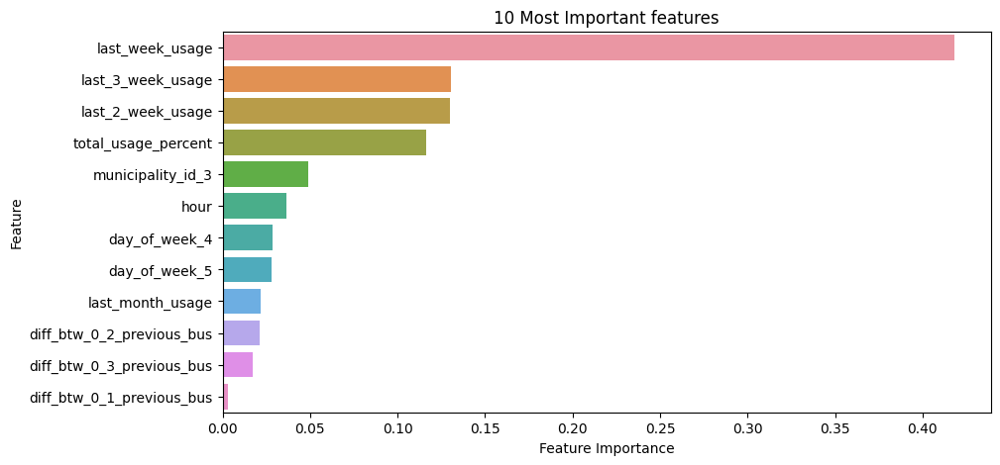

In [62]:
plt.figure(figsize=(10,5))
sns.barplot(y = important_features['Feature'], x = important_features['Feature Importance'] )
plt.title('10 Most Important features')
plt.show()

In [63]:
print('Mean Squared Error (MSE): ',mean_squared_error(y_test, test_preds))
print('Mean Absolute Error (MAE): ',mean_absolute_error(y_test, test_preds))
print('Root Mean Squared Error (MSE): ',np.sqrt(mean_squared_error(y_test, test_preds)))
print('R2 Score: ',r2)
print('Adjusted R2 Score: ',adj_r2)

Mean Squared Error (MSE):  1058.986372854509
Mean Absolute Error (MAE):  20.264769536676543
Root Mean Squared Error (MSE):  32.54207081386354
R2 Score:  0.9979361436834885
Adjusted R2 Score:  0.9979185414974202


In [64]:
df_test_municipalities = data.loc[data["is_test"] == 1].reset_index().filter(regex='municipality_id')
df_test_municipalities

,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9
0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
1415,0,0,0,1,0,0,0,0,0,0
1416,0,0,1,0,0,0,0,0,0,0
1417,0,1,0,0,0,0,0,0,0,0
1418,1,0,0,0,0,0,0,0,0,0


In [65]:
df_test_municipalities["actual_usage"] = y_test.reset_index(drop=True)
df_test_municipalities["pred_usage"] = test_preds
df_test_municipalities

,municipality_id_0,municipality_id_1,municipality_id_2,municipality_id_3,municipality_id_4,municipality_id_5,municipality_id_6,municipality_id_7,municipality_id_8,municipality_id_9,actual_usage,pred_usage
0,0,0,0,0,1,0,0,0,0,0,2132,2125.302246
1,0,0,0,1,0,0,0,0,0,0,781,780.451233
2,0,0,0,0,0,0,0,1,0,0,651,673.656006
3,0,0,0,0,0,0,0,0,1,0,572,568.885010
4,0,0,0,0,0,0,0,0,0,1,333,379.338837
...,...,...,...,...,...,...,...,...,...,...,...,...
1415,0,0,0,1,0,0,0,0,0,0,1330,1322.754395
1416,0,0,1,0,0,0,0,0,0,0,580,618.906372
1417,0,1,0,0,0,0,0,0,0,0,401,397.363159
1418,1,0,0,0,0,0,0,0,0,0,1276,1179.896606


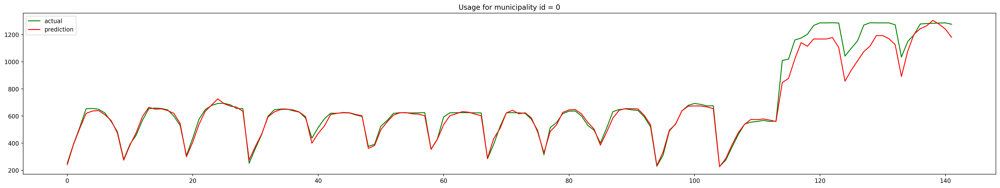

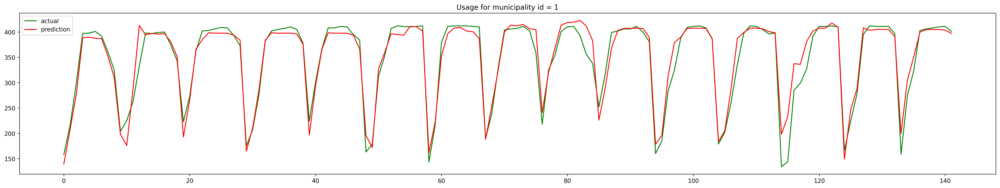

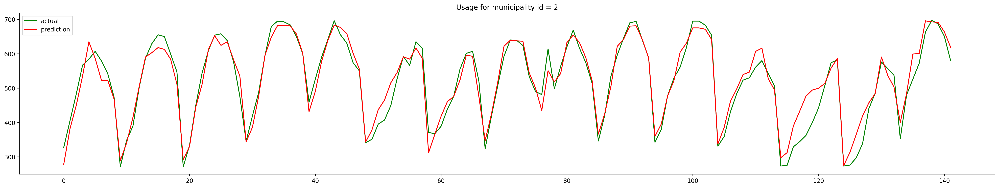

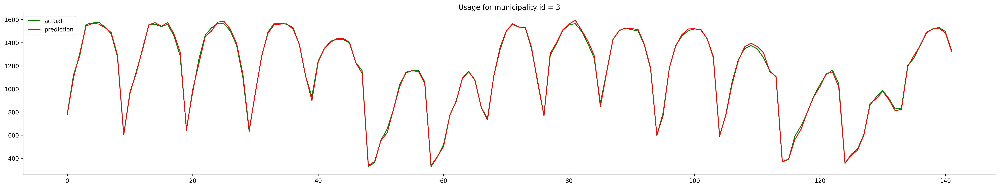

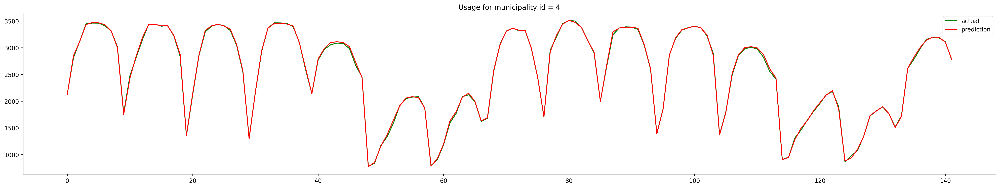

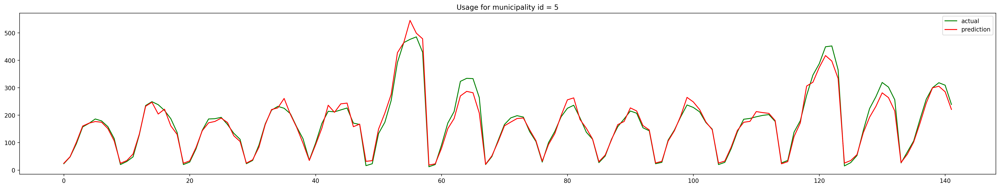

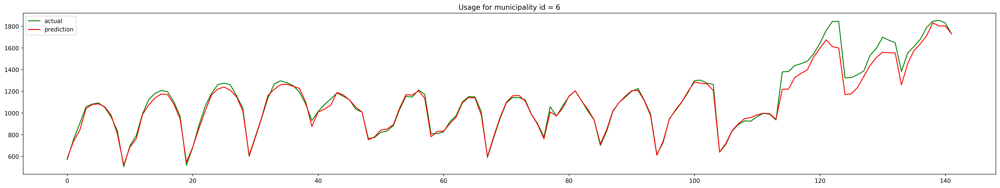

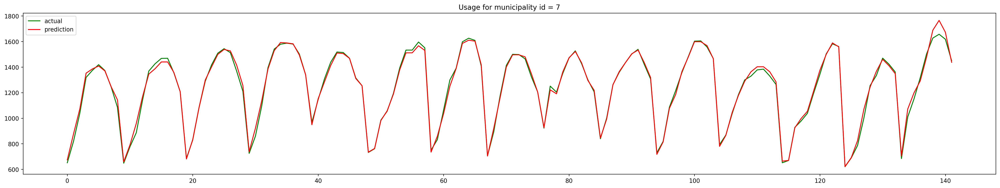

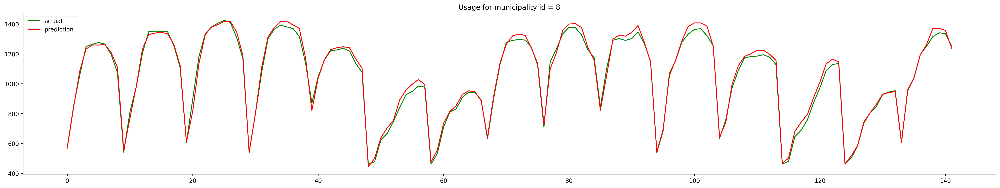

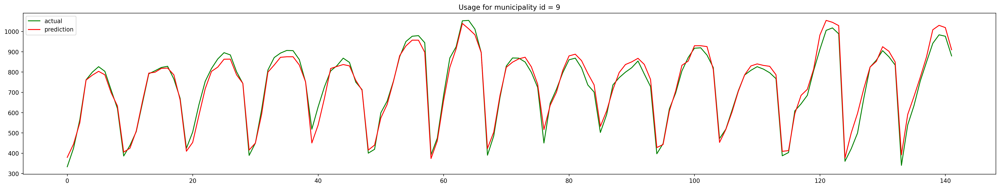

In [72]:

d_rmse_last = {}

for mun_col in df_test_municipalities.columns.difference(["actual_usage", "pred_usage"]):
    municipality_id = mun_col.split("_")[-1]
    results_municipality_id = df_test_municipalities.loc[df_test_municipalities[mun_col] == 1][["actual_usage", "pred_usage"]]
    
    ts_true = results_municipality_id["actual_usage"]
    ts_pred = results_municipality_id["pred_usage"]
    
    test_score = np.sqrt(mean_squared_error(ts_true, ts_pred)) 
    d_rmse_last['id{}:'.format(municipality_id)] =  np.round(test_score, 2)

    plt.figure(figsize=(30, 5), dpi=250)
    
    plt.plot([x for x in ts_true], label = "actual", color="g")
    plt.plot([x for x in ts_pred], label = "prediction", color="r")
    plt.title('Usage for municipality id = {}'.format(municipality_id))
    plt.legend()
    plt.show()
     

In [73]:
print("RMSEs for all ids with XGB model:")
print(d_rmse_last)

RMSEs for all ids with XGB model:
{'id0:': 55.23, 'id1:': 21.11, 'id2:': 31.19, 'id3:': 14.23, 'id4:': 20.47, 'id5:': 18.85, 'id6:': 54.22, 'id7:': 24.62, 'id8:': 26.04, 'id9:': 30.33}


#### Compare baseline and last model performance

In [74]:
d_rmse

{'id0:': 340.98,
 'id1:': 120.57,
 'id2:': 132.63,
 'id3:': 402.22,
 'id4:': 976.27,
 'id5:': 123.5,
 'id6:': 323.85,
 'id7:': 320.48,
 'id8:': 333.13,
 'id9:': 208.31}

In [75]:
d_rmse_last

{'id0:': 55.23,
 'id1:': 21.11,
 'id2:': 31.19,
 'id3:': 14.23,
 'id4:': 20.47,
 'id5:': 18.85,
 'id6:': 54.22,
 'id7:': 24.62,
 'id8:': 26.04,
 'id9:': 30.33}

Text(0.5, 1.0, 'first')

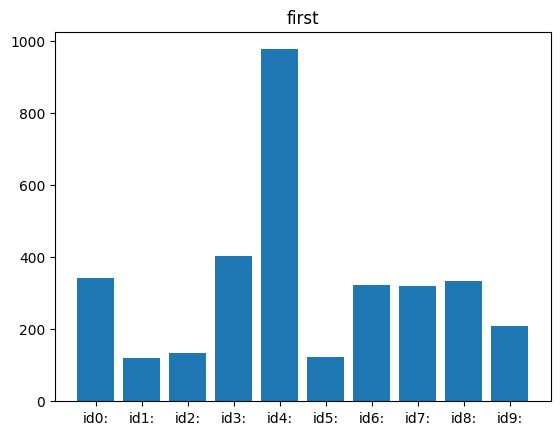

In [76]:
keys = [str(val) for val in list(d_rmse.keys())]
vals = list(d_rmse.values())

plt.bar(keys, vals)
plt.title("first")

Text(0.5, 1.0, 'last')

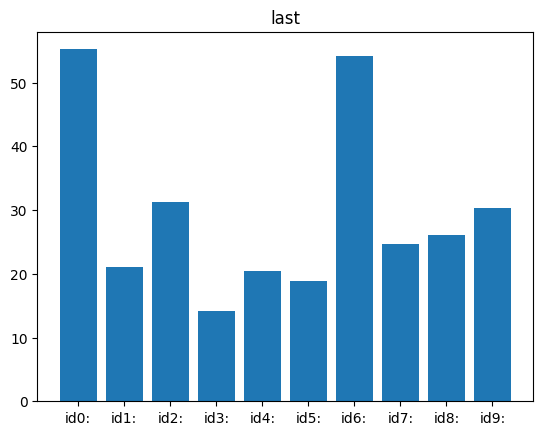

In [77]:
keys = [str(val) for val in list(d_rmse_last.keys())]
vals = list(d_rmse_last.values())

plt.bar(keys, vals)
plt.title("last")